## My Conv Net Activation Nodes Visualizations

In [1]:
import tensorflow_datasets as tfds
import tensorflow as tf
import keras
from keras.models import Sequential,Model
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D,GlobalAveragePooling2D
from keras.utils import plot_model
from tensorflow.keras import layers
from tensorflow.keras.applications import vgg16
import numpy as np
import matplotlib.pyplot as plt
import cv2
import scipy as sp

## Project topic:

In this work we will generate images that will visualize what the different filters of a convnet actually see, or what kinds of patterns they respond to. We will do it by maximazing each actiation layer using gradient ascent. 
Here, we will use a pre-trained VGG16 network trained on the imagenet dataset. 

### Modelling - VGG16:

In [2]:
IMAGE_SIZE = (224, 224)
def VGG16():
    # load the base VGG16 model
    base_model = vgg16.VGG16(input_shape=IMAGE_SIZE + (3,), weights='imagenet', include_top=False)

    # add a GAP layer
    output = layers.GlobalAveragePooling2D()(base_model.output)

    # output has two neurons for the 2 classes (cats and dogs)
    output = layers.Dense(2, activation='softmax')(output)

    # set the inputs and outputs of the model
    model = Model(base_model.input, output)

    # choose the optimizer
    optimizer = tf.keras.optimizers.RMSprop(0.001)

    # configure the model for training
    model.compile(loss='sparse_categorical_crossentropy',optimizer=optimizer,metrics=['accuracy']) 

    # display the summary
    model.summary()

    return model

In [3]:
model = VGG16()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

## Set up the gradient ascent process

### Define the loss:
The "loss" we will maximize is simply the mean of the activation of a specific filter in our target layer. To avoid border effects, we exclude border pixels.

In [4]:
def compute_loss(input_image, filter_index):
    
    activation = feature_extractor(input_image)
    
    # Avoid border artifacts by only involving non-border pixels in the loss.
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    
    return tf.reduce_mean(filter_activation)

### Gradient ascent step:
Our gradient ascent function simply computes the gradients of the loss above with regard to the input image, and update the update image so as to move it towards a state that will activate the target filter more strongly.

In [5]:
def gradient_ascent_step(img, filter_index, learning_rate):
    
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
   
    # Compute gradients.
    grads = tape.gradient(loss, img)
    
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    
    return loss, img

### Set up the filter visualization loop
Start from a random image


In [6]:
def initialize_image():
    
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, IMAGE_SIZE[0], IMAGE_SIZE[1], 3),minval=0, maxval=1) 
    img = tf.cast(img, tf.float32)
    
    return img

A function for proccessing the generated image after the iterations

In [7]:
def deprocess_image(img):
    
    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    
    return img

The image generation algorithm for a single filter:

In [8]:
def visualize_filter(filter_index):
    
    # We run gradient ascent for 30 steps
    iterations = 30
    learning_rate = 10
    img = initialize_image()
    
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    
    return loss, img

Choose which convolution blocks we want to visualize thier activation filters, in this case we will choose all the convolution blocks in the model:

In [9]:
layer_names = ['block1_conv1','block1_conv2','block2_conv1','block2_conv2','block3_conv1','block3_conv2',
               'block3_conv3','block4_conv1','block4_conv2','block4_conv3','block5_conv1','block5_conv2','block5_conv3']

Run the algorithm for each channel in all convolution blocks, store the generated images in a dictionary:

In [10]:
activation_dict = dict()

for layer_name in layer_names:
    
    activations = []
    layer = model.get_layer(name=layer_name)
    feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)
    num_filters = layer.output_shape[3]
    
    for i in range(num_filters):
        
        _, img = visualize_filter(i)
        activations.append(img)
    
    activation_dict[layer_name] = activations 
    
# np.save('activation_dict.npy')
# activation_dict = np.load('activation_dict.npy',allow_pickle=True)
# activation_dict = activation_dict.tolist() 

Helper function for displaying the generated images by conv blocks:

In [11]:
def show_Visualizations(activation_layer_images, layer_name):
    
    images = activation_layer_images[0:16]
    num_images = len(images) # Need to devide by 4 
    fig=plt.figure(figsize=(24,int(num_images/2.5)))
    columns = 8
    rows = int(num_images/columns)
    plt.title(layer_name)
    
    for i,img in enumerate(images):
        
        fig.add_subplot(rows, columns, i+1)
        plt.imshow(img)
        plt.title('#' + str(i))
        plt.axis('off')
        
    plt.show()


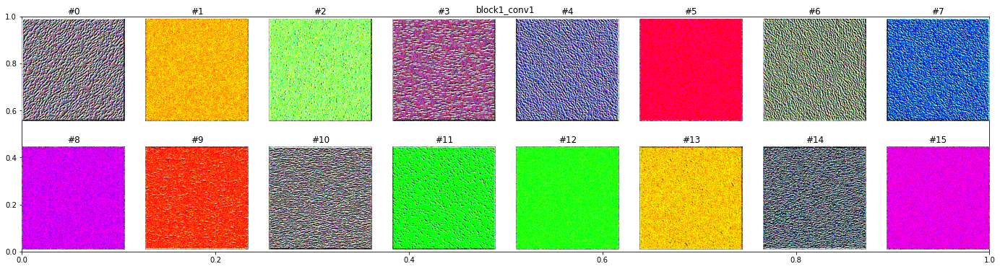

In [12]:
show_Visualizations(activation_dict['block1_conv1'], 'block1_conv1')

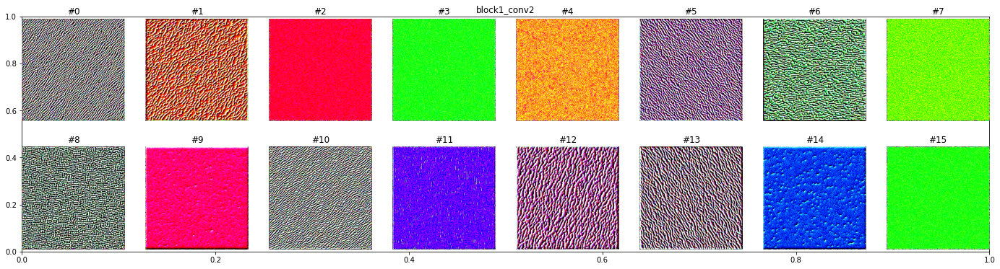

In [13]:
show_Visualizations(activation_dict['block1_conv2'], 'block1_conv2')

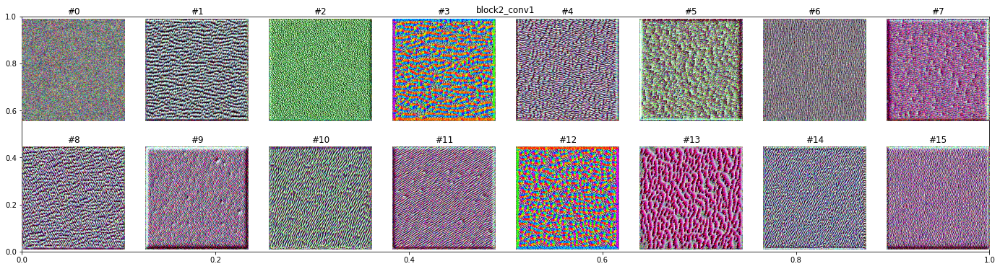

In [14]:
show_Visualizations(activation_dict['block2_conv1'], 'block2_conv1')

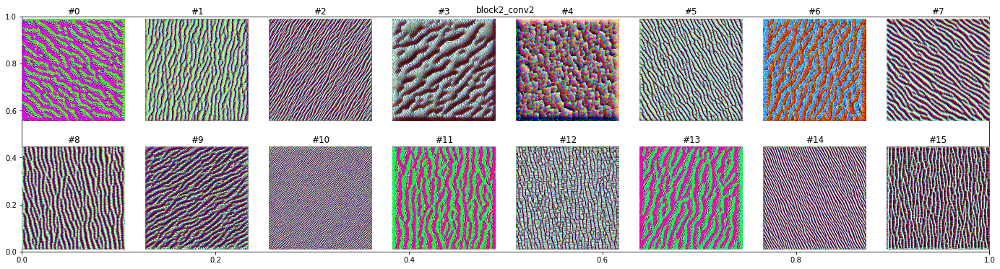

In [15]:
show_Visualizations(activation_dict['block2_conv2'], 'block2_conv2')

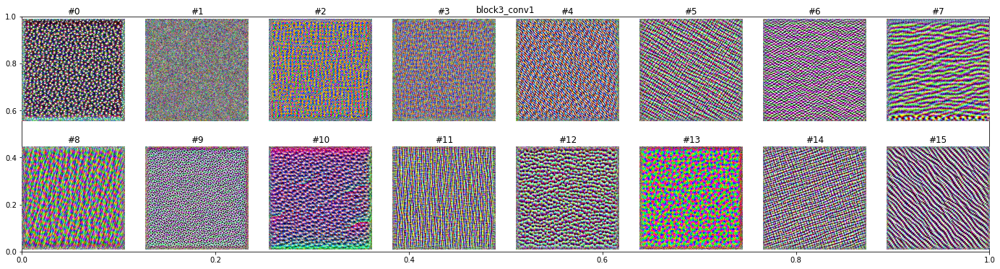

In [16]:
show_Visualizations(activation_dict['block3_conv1'], 'block3_conv1')

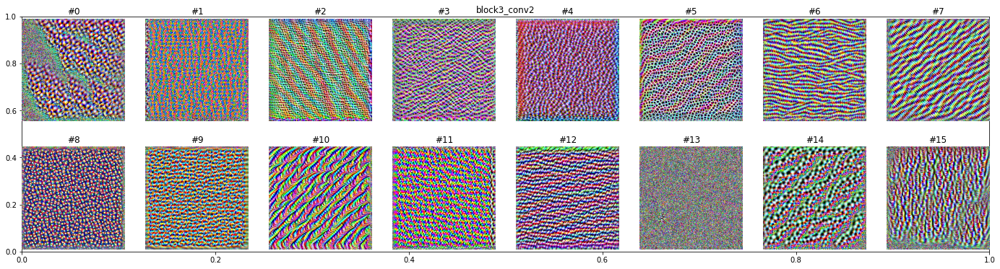

In [17]:
show_Visualizations(activation_dict['block3_conv2'], 'block3_conv2')

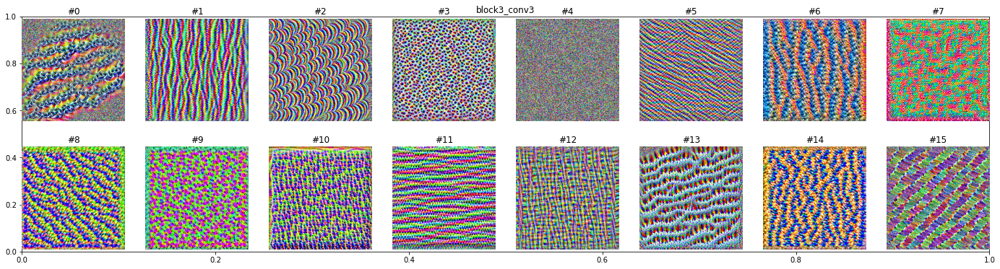

In [18]:
show_Visualizations(activation_dict['block3_conv3'], 'block3_conv3')

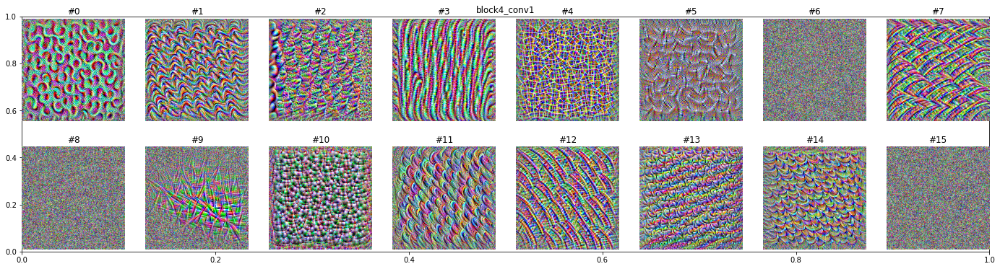

In [19]:
show_Visualizations(activation_dict['block4_conv1'], 'block4_conv1')

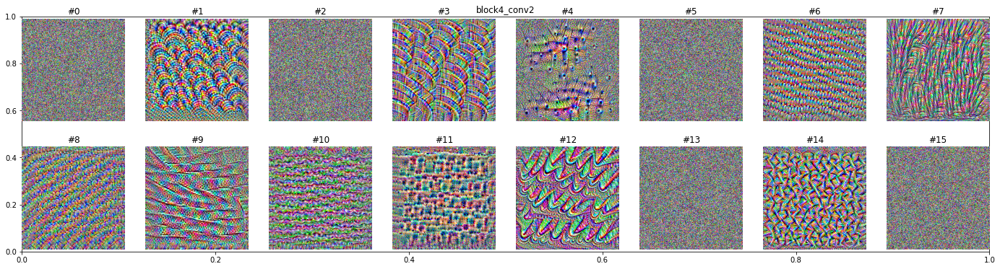

In [20]:
show_Visualizations(activation_dict['block4_conv2'], 'block4_conv2')

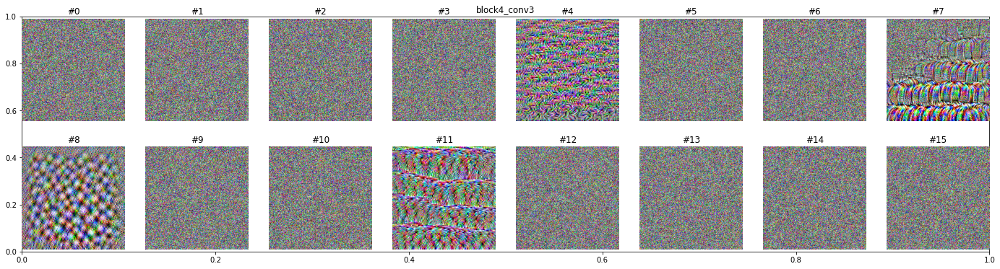

In [21]:
show_Visualizations(activation_dict['block4_conv3'], 'block4_conv3')

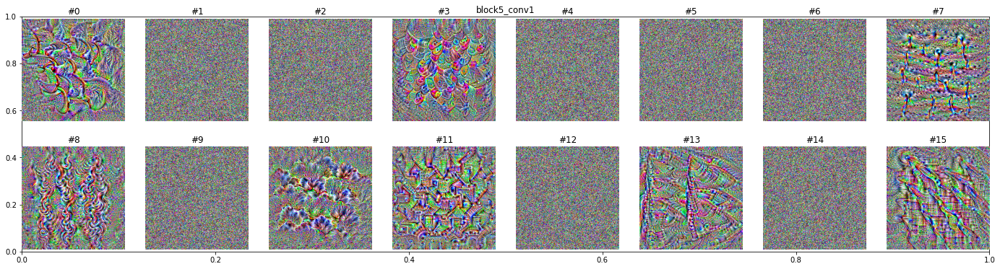

In [22]:
show_Visualizations(activation_dict['block5_conv1'], 'block5_conv1')

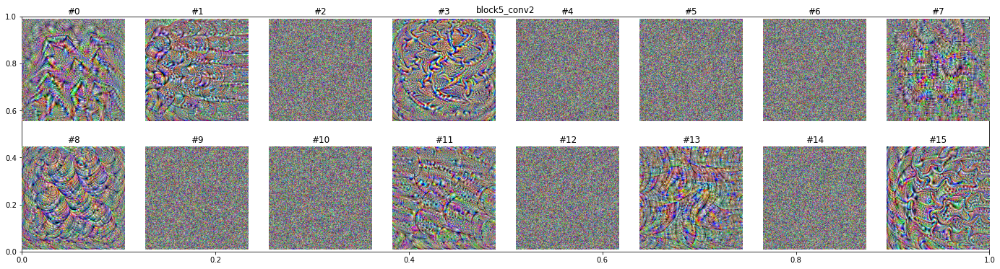

In [23]:
show_Visualizations(activation_dict['block5_conv2'], 'block5_conv2')

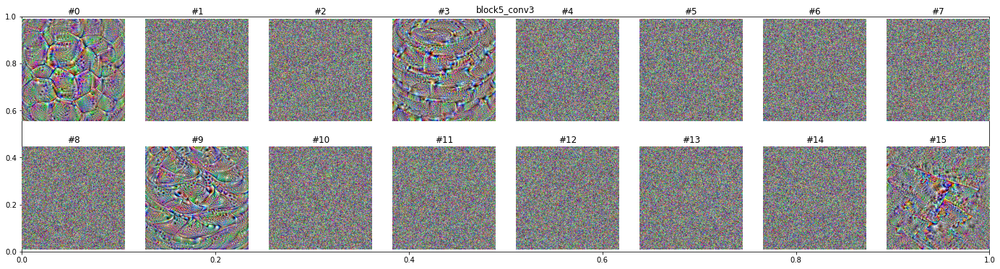

In [24]:
show_Visualizations(activation_dict['block5_conv3'], 'block5_conv3')

As we expected, we can see that the activation of the filters of the early stage blocks respond to low level patterns such as colors and textures, and as we procceed in the extended stages of the network we can find more high level features of the network. 

### Fun exercise: let's pick some of the interesting activations and run the gradient ascent on a real image of my cat Kelly: 

In [25]:
def preproccess_image(image):
    # load the image
    img = cv2.imread(image)

    # preprocess the image before feeding it to the model
    img = cv2.resize(img, IMAGE_SIZE) / 255.0

    # add a batch dimension because the model expects it
    tensor_image = np.expand_dims(img, axis=0)

    return tensor_image

img = preproccess_image('Kelly.JPG')

In [26]:
layer_name = 'block5_conv3'
filter_num = 382
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)

def visualize_filter_on_image(filter_index, img):
    
    # We run gradient ascent for 30 steps
    iterations = 20
    learning_rate = 2
    img = tf.cast(img, tf.float32)    
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    
    return loss, img



_, img = visualize_filter_on_image(filter_num, img)


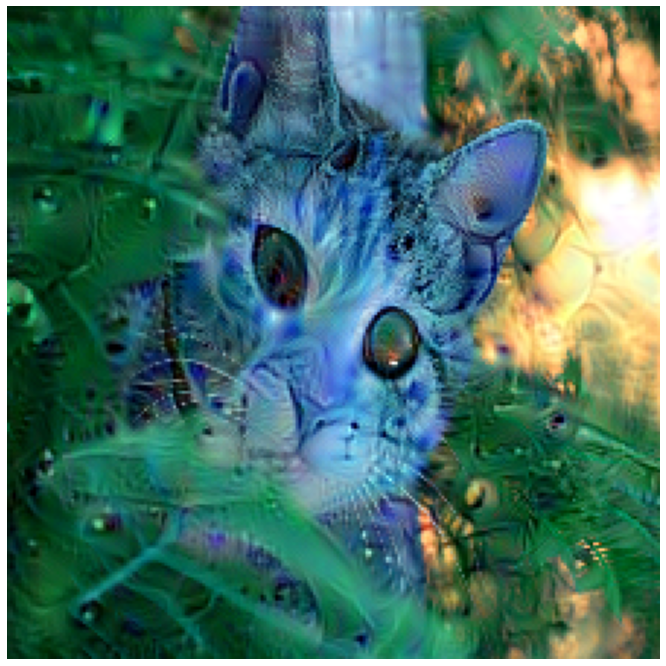

In [27]:
fig=plt.figure(figsize=(12,12))
plt.imshow(img)
plt.axis('off')
plt.show()